# UMAP

## UMAP plots of a sample 800 x 800 pixel region of the Eaton Fire AVIRIS-3 imagery

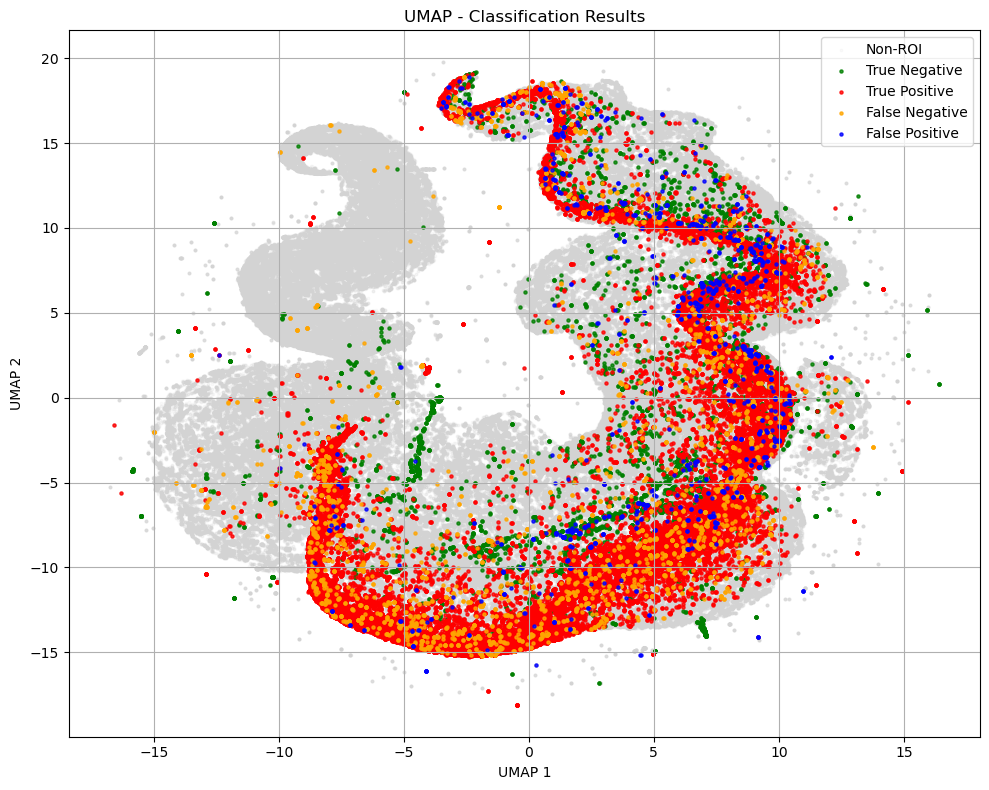

In [5]:
# n100 d2

import numpy as np
import matplotlib.pyplot as plt
import rasterio

# --- Load UMAP image ---
# Load 2-band UMAP image
with rasterio.open("/Volumes/GEOG/Structure_classification/UMAP/AV3-post-fire_UMAP-800_n100_d2") as src:
    umap_data = src.read()  # shape: (2, H, W)

# Load ROI masks
roi_files = ['/Volumes/GEOG/Structure_classification/UMAP/TN_mask', '/Volumes/GEOG/Structure_classification/UMAP/TP_mask', '/Volumes/GEOG/Structure_classification/UMAP/FN_mask', '/Volumes/GEOG/Structure_classification/UMAP/FP_mask']
roi_masks = []
for roi_path in roi_files:
    with rasterio.open(roi_path) as roi_src:
        roi_mask = roi_src.read(1) > 0  
        roi_masks.append(roi_mask)

# Rearrange to shape (H, W, 2)
umap_image = np.transpose(umap_data, (1, 2, 0))  # shape: (H, W, 2)
H, W, _ = umap_image.shape

# --- Flatten UMAP image to 2D points ---
umap_flat = umap_image.reshape(-1, 2)  # shape: (H*W, 2)

# --- Create labels array ---
labels = -1 * np.ones(H * W, dtype=int)  # -1 = not in any ROI
for i, mask in enumerate(roi_masks):
    labels[mask.flatten()] = i

# --- Plot ---
plt.figure(figsize=(10, 8))

# Plot non-ROI pixels in light gray
non_roi_idx = labels == -1
plt.scatter(umap_flat[non_roi_idx, 0], umap_flat[non_roi_idx, 1],
            s=3, color='lightgray', alpha=0.1, label='Non-ROI')

# ROI names
roi_names = ["True Negative", "True Positive", "False Negative", "False Positive"]

# Plot ROI pixels 
colors = ['green', 'red', 'orange', 'blue']
for i in range(4):
    roi_idx = labels == i
    plt.scatter(umap_flat[roi_idx, 0], umap_flat[roi_idx, 1],
                s=5, color=colors[i], label=roi_names[i], alpha=0.8)

plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.title("UMAP - Classification Results")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

/var/folders/br/pyt6szbd2wb4q6n5wqkffrbc0000gn/T/ipykernel_33894/3181133937.py:53: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


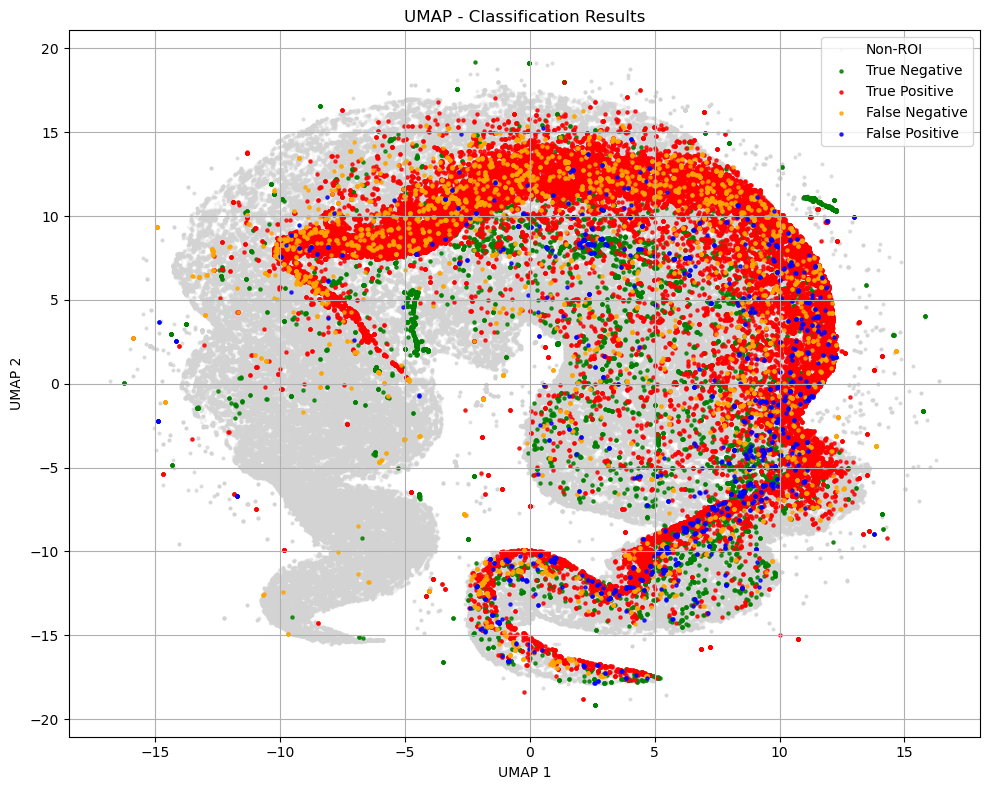

In [4]:
# n80 d2

import numpy as np
import matplotlib.pyplot as plt
import rasterio

# --- Load UMAP image ---
# Load 2-band UMAP image
with rasterio.open("/Volumes/GEOG/Structure_classification/UMAP/umap_800/PostFireAVIRIS_800_again_UMAP_n80_d2") as src:
    umap_data = src.read()  # shape: (2, H, W)

# Load ROI masks
roi_files = ['/Volumes/GEOG/Structure_classification/UMAP/TN_mask', '/Volumes/GEOG/Structure_classification/UMAP/TP_mask', '/Volumes/GEOG/Structure_classification/UMAP/FN_mask', '/Volumes/GEOG/Structure_classification/UMAP/FP_mask']
roi_masks = []
for roi_path in roi_files:
    with rasterio.open(roi_path) as roi_src:
        roi_mask = roi_src.read(1) > 0  
        roi_masks.append(roi_mask)

# Rearrange to shape (H, W, 2)
umap_image = np.transpose(umap_data, (1, 2, 0))  # shape: (H, W, 2)
H, W, _ = umap_image.shape

# --- Flatten UMAP image to 2D points ---
umap_flat = umap_image.reshape(-1, 2)  # shape: (H*W, 2)

# --- Create labels array ---
labels = -1 * np.ones(H * W, dtype=int)  # -1 = not in any ROI
for i, mask in enumerate(roi_masks):
    labels[mask.flatten()] = i

# --- Plot ---
plt.figure(figsize=(10, 8))

# Plot non-ROI pixels in light gray
non_roi_idx = labels == -1
plt.scatter(umap_flat[non_roi_idx, 0], umap_flat[non_roi_idx, 1],
            s=3, color='lightgray', alpha=0.1, label='Non-ROI')

# ROI names
roi_names = ["True Negative", "True Positive", "False Negative", "False Positive"]

# Plot ROI pixels 
colors = ['green', 'red', 'orange', 'blue']
for i in range(4):
    roi_idx = labels == i
    plt.scatter(umap_flat[roi_idx, 0], umap_flat[roi_idx, 1],
                s=5, color=colors[i], label=roi_names[i], alpha=0.8)

plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.title("UMAP - Classification Results")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### Filter out structures near the decision boundary (threshold ± 0.15) to get cleaner examples of confident predictions (both correct and incorrect).
Remove 0.15 from either side of the threshold (threshold set by Youden's J)

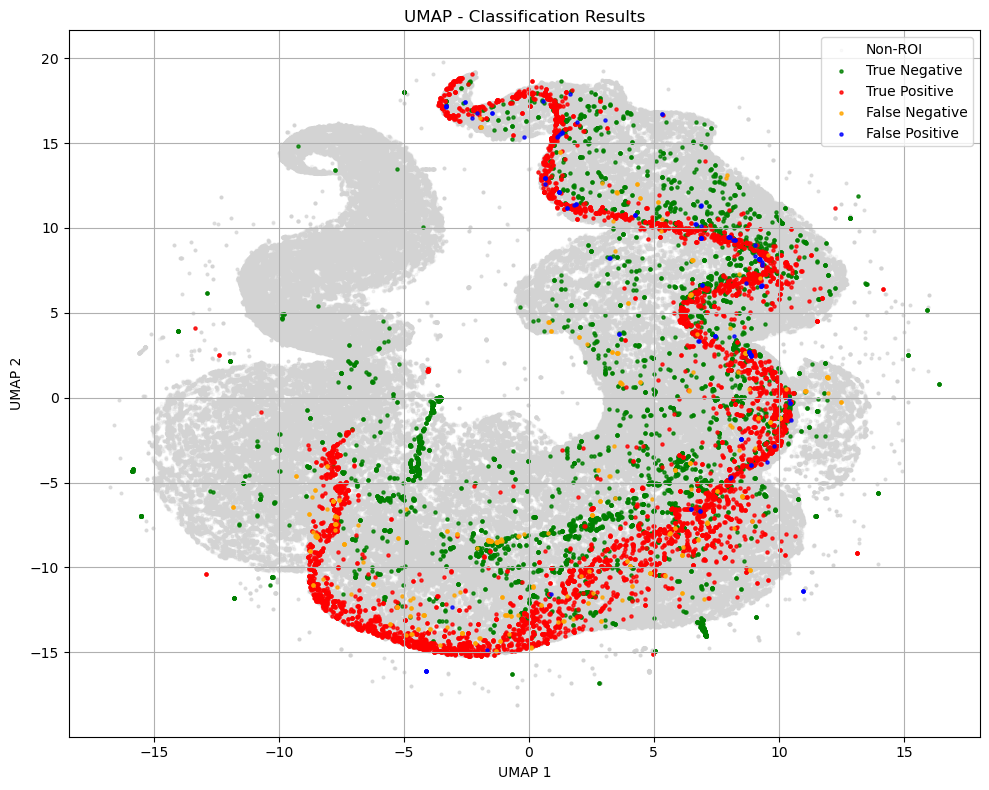

In [6]:
# n100 d2

import numpy as np
import matplotlib.pyplot as plt
import rasterio

# --- Load UMAP image ---
# Load 2-band UMAP image
with rasterio.open("/Volumes/GEOG/Structure_classification/UMAP/AV3-post-fire_UMAP-800_n100_d2") as src:
    umap_data = src.read()  # shape: (2, H, W)

# Load ROI masks
roi_files = ['/Volumes/GEOG/Structure_classification/UMAP/TN_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/TP_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/FN_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/FP_confident_mask']
roi_masks = []
for roi_path in roi_files:
    with rasterio.open(roi_path) as roi_src:
        roi_mask = roi_src.read(1) > 0  
        roi_masks.append(roi_mask)

# Rearrange to shape (H, W, 2)
umap_image = np.transpose(umap_data, (1, 2, 0))  # shape: (H, W, 2)
H, W, _ = umap_image.shape

# --- Flatten UMAP image to 2D points ---
umap_flat = umap_image.reshape(-1, 2)  # shape: (H*W, 2)

# --- Create labels array ---
labels = -1 * np.ones(H * W, dtype=int)  # -1 = not in any ROI
for i, mask in enumerate(roi_masks):
    labels[mask.flatten()] = i

# --- Plot ---
plt.figure(figsize=(10, 8))

# Plot non-ROI pixels in light gray
non_roi_idx = labels == -1
plt.scatter(umap_flat[non_roi_idx, 0], umap_flat[non_roi_idx, 1],
            s=3, color='lightgray', alpha=0.1, label='Non-ROI')

# ROI names
roi_names = ["True Negative", "True Positive", "False Negative", "False Positive"]

# Plot ROI pixels 
colors = ['green', 'red', 'orange', 'blue']
for i in range(4):
    roi_idx = labels == i
    plt.scatter(umap_flat[roi_idx, 0], umap_flat[roi_idx, 1],
                s=5, color=colors[i], label=roi_names[i], alpha=0.8)

plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.title("UMAP - Classification Results")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

/var/folders/br/pyt6szbd2wb4q6n5wqkffrbc0000gn/T/ipykernel_33894/3360518819.py:53: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


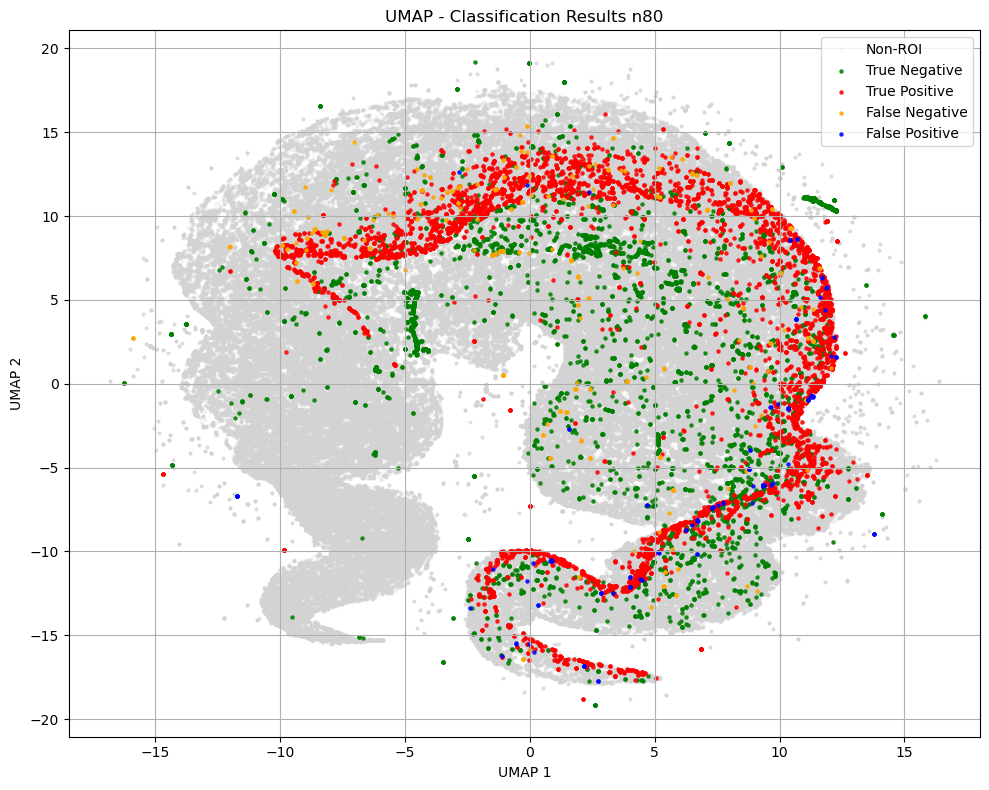

In [11]:
# n80 d2

import numpy as np
import matplotlib.pyplot as plt
import rasterio

# --- Load UMAP image ---
# Load 2-band UMAP image
with rasterio.open("/Volumes/GEOG/Structure_classification/UMAP/umap_800/PostFireAVIRIS_800_again_UMAP_n80_d2") as src:
    umap_data = src.read()  # shape: (2, H, W)

# Load ROI masks
roi_files = ['/Volumes/GEOG/Structure_classification/UMAP/TN_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/TP_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/FN_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/FP_confident_mask']
roi_masks = []
for roi_path in roi_files:
    with rasterio.open(roi_path) as roi_src:
        roi_mask = roi_src.read(1) > 0  
        roi_masks.append(roi_mask)

# Rearrange to shape (H, W, 2)
umap_image = np.transpose(umap_data, (1, 2, 0))  # shape: (H, W, 2)
H, W, _ = umap_image.shape

# --- Flatten UMAP image to 2D points ---
umap_flat = umap_image.reshape(-1, 2)  # shape: (H*W, 2)

# --- Create labels array ---
labels = -1 * np.ones(H * W, dtype=int)  # -1 = not in any ROI
for i, mask in enumerate(roi_masks):
    labels[mask.flatten()] = i

# --- Plot ---
plt.figure(figsize=(10, 8))

# Plot non-ROI pixels in light gray
non_roi_idx = labels == -1
plt.scatter(umap_flat[non_roi_idx, 0], umap_flat[non_roi_idx, 1],
            s=3, color='lightgray', alpha=0.1, label='Non-ROI')

# ROI names
roi_names = ["True Negative", "True Positive", "False Negative", "False Positive"]

# Plot ROI pixels 
colors = ['green', 'red', 'orange', 'blue']
for i in range(4):
    roi_idx = labels == i
    plt.scatter(umap_flat[roi_idx, 0], umap_flat[roi_idx, 1],
                s=5, color=colors[i], label=roi_names[i], alpha=0.8)

plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.title("UMAP - Classification Results n80")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

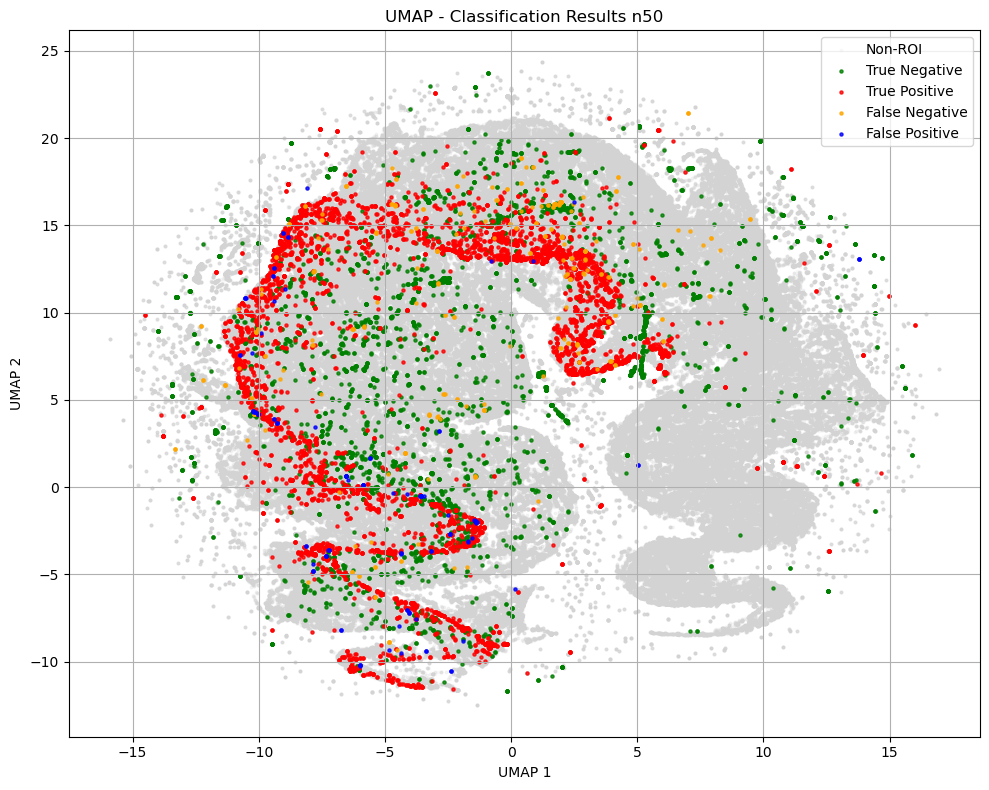

In [10]:
# n50 d2

import numpy as np
import matplotlib.pyplot as plt
import rasterio

# --- Load UMAP image ---
# Load 2-band UMAP image
with rasterio.open("/Volumes/GEOG/Structure_classification/UMAP/umap_800/PostFireAVIRIS_800_again_UMAP_n50_d2") as src:
    umap_data = src.read()  # shape: (2, H, W)

# Load ROI masks
roi_files = ['/Volumes/GEOG/Structure_classification/UMAP/TN_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/TP_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/FN_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/FP_confident_mask']
roi_masks = []
for roi_path in roi_files:
    with rasterio.open(roi_path) as roi_src:
        roi_mask = roi_src.read(1) > 0  # or == 1, depending on your ROI format
        roi_masks.append(roi_mask)

# Rearrange to shape (H, W, 2)
umap_image = np.transpose(umap_data, (1, 2, 0))  # shape: (H, W, 2)
H, W, _ = umap_image.shape

# --- Flatten UMAP image to 2D points ---
umap_flat = umap_image.reshape(-1, 2)  # shape: (H*W, 2)

# --- Create labels array ---
labels = -1 * np.ones(H * W, dtype=int)  # -1 = not in any ROI
for i, mask in enumerate(roi_masks):
    labels[mask.flatten()] = i

# --- Plot ---
plt.figure(figsize=(10, 8))

# Plot non-ROI pixels in light gray
non_roi_idx = labels == -1
plt.scatter(umap_flat[non_roi_idx, 0], umap_flat[non_roi_idx, 1],
            s=3, color='lightgray', alpha=0.1, label='Non-ROI')

# Custom ROI names
roi_names = ["True Negative", "True Positive", "False Negative", "False Positive"]

# Plot ROI pixels with custom labels
colors = ['green', 'red', 'orange', 'blue']
for i in range(4):
    roi_idx = labels == i
    plt.scatter(umap_flat[roi_idx, 0], umap_flat[roi_idx, 1],
                s=5, color=colors[i], label=roi_names[i], alpha=0.8)

plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.title("UMAP - Classification Results n50")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### 3-dimensional UMAP

/var/folders/br/pyt6szbd2wb4q6n5wqkffrbc0000gn/T/ipykernel_33894/2273421194.py:57: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


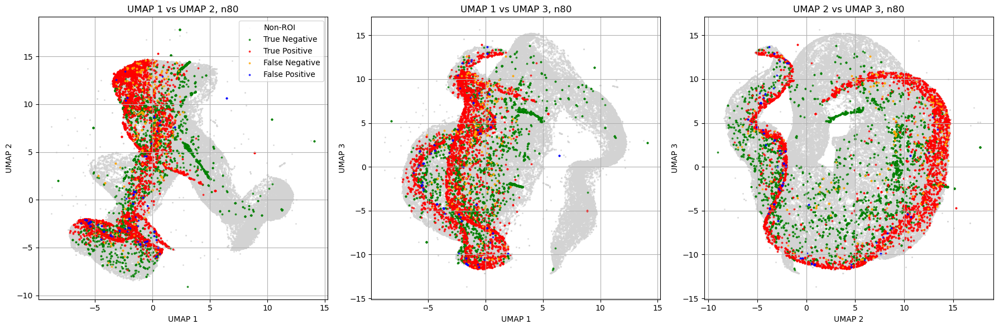

In [12]:
# n80 d3

import numpy as np
import matplotlib.pyplot as plt
import rasterio

# --- Load 3-band UMAP image ---
with rasterio.open("/Volumes/GEOG/Structure_classification/UMAP/umap_800/PostFireAVIRIS_800_again_UMAP_n80_d3") as src:
    umap_data = src.read()  # shape: (3, H, W)

# Load ROI masks
roi_files = ['/Volumes/GEOG/Structure_classification/UMAP/TN_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/TP_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/FN_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/FP_confident_mask']
roi_masks = []
for roi_path in roi_files:
    with rasterio.open(roi_path) as roi_src:
        roi_mask = roi_src.read(1) > 0
        roi_masks.append(roi_mask)

# Rearrange to shape (H, W, 3)
umap_image = np.transpose(umap_data, (1, 2, 0))  # shape: (H, W, 3)
H, W, _ = umap_image.shape

# --- Flatten UMAP image to 2D points ---
umap_flat = umap_image.reshape(-1, 3)  # shape: (H*W, 3)

# --- Create labels array ---
labels = -1 * np.ones(H * W, dtype=int)  # -1 = not in any ROI
for i, mask in enumerate(roi_masks):
    labels[mask.flatten()] = i

# --- Plot all 3 pairwise combinations ---
combinations = [(0, 1), (0, 2), (1, 2)]
axis_labels = [("UMAP 1", "UMAP 2"), ("UMAP 1", "UMAP 3"), ("UMAP 2", "UMAP 3")]

roi_names = ["True Negative", "True Positive", "False Negative", "False Positive"]
colors = ['green', 'red', 'orange', 'blue']

fig, axs = plt.subplots(1, 3, figsize=(18, 6))

for ax, (ix, iy), (xlabel, ylabel) in zip(axs, combinations, axis_labels):
    # Plot non-ROI pixels
    non_roi_idx = labels == -1
    ax.scatter(umap_flat[non_roi_idx, ix], umap_flat[non_roi_idx, iy],
               s=1, color='lightgray', alpha=0.1, label='Non-ROI')

    # Plot ROI pixels
    for i in range(4):
        roi_idx = labels == i
        ax.scatter(umap_flat[roi_idx, ix], umap_flat[roi_idx, iy],
                   s=3, color=colors[i], label=roi_names[i], alpha=0.7)

    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(f"{xlabel} vs {ylabel}, n80")
    ax.grid(True)

# Only show legend in one subplot
axs[0].legend()
plt.tight_layout()
plt.show()


/var/folders/br/pyt6szbd2wb4q6n5wqkffrbc0000gn/T/ipykernel_33894/713077766.py:57: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


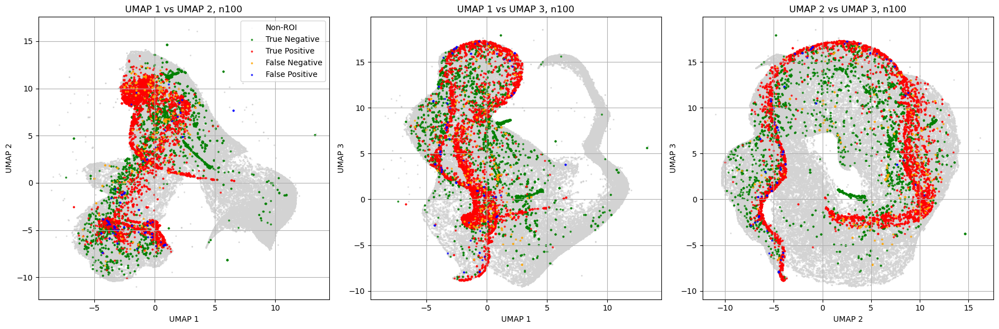

In [19]:
# n100 d3

import numpy as np
import matplotlib.pyplot as plt
import rasterio

# --- Load 3-band UMAP image ---
with rasterio.open("/Volumes/GEOG/Structure_classification/UMAP/umap_800/PostFireAVIRIS_800_again_UMAP_n100_d3") as src:
    umap_data = src.read()  # shape: (3, H, W)

# Load ROI masks
roi_files = ['/Volumes/GEOG/Structure_classification/UMAP/TN_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/TP_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/FN_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/FP_confident_mask']
roi_masks = []
for roi_path in roi_files:
    with rasterio.open(roi_path) as roi_src:
        roi_mask = roi_src.read(1) > 0
        roi_masks.append(roi_mask)

# Rearrange to shape (H, W, 3)
umap_image = np.transpose(umap_data, (1, 2, 0))  # shape: (H, W, 3)
H, W, _ = umap_image.shape

# --- Flatten UMAP image to 2D points ---
umap_flat = umap_image.reshape(-1, 3)  # shape: (H*W, 3)

# --- Create labels array ---
labels = -1 * np.ones(H * W, dtype=int)  # -1 = not in any ROI
for i, mask in enumerate(roi_masks):
    labels[mask.flatten()] = i

# --- Plot all 3 pairwise combinations ---
combinations = [(0, 1), (0, 2), (1, 2)]
axis_labels = [("UMAP 1", "UMAP 2"), ("UMAP 1", "UMAP 3"), ("UMAP 2", "UMAP 3")]

roi_names = ["True Negative", "True Positive", "False Negative", "False Positive"]
colors = ['green', 'red', 'orange', 'blue']

fig, axs = plt.subplots(1, 3, figsize=(18, 6))

for ax, (ix, iy), (xlabel, ylabel) in zip(axs, combinations, axis_labels):
    # Plot non-ROI pixels
    non_roi_idx = labels == -1
    ax.scatter(umap_flat[non_roi_idx, ix], umap_flat[non_roi_idx, iy],
               s=1, color='lightgray', alpha=0.1, label='Non-ROI')

    # Plot ROI pixels
    for i in range(4):
        roi_idx = labels == i
        ax.scatter(umap_flat[roi_idx, ix], umap_flat[roi_idx, iy],
                   s=3, color=colors[i], label=roi_names[i], alpha=0.7)

    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(f"{xlabel} vs {ylabel}, n100")
    ax.grid(True)

# Only show legend in one subplot
axs[0].legend()
plt.tight_layout()
plt.show()


/var/folders/br/pyt6szbd2wb4q6n5wqkffrbc0000gn/T/ipykernel_33894/81218562.py:57: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


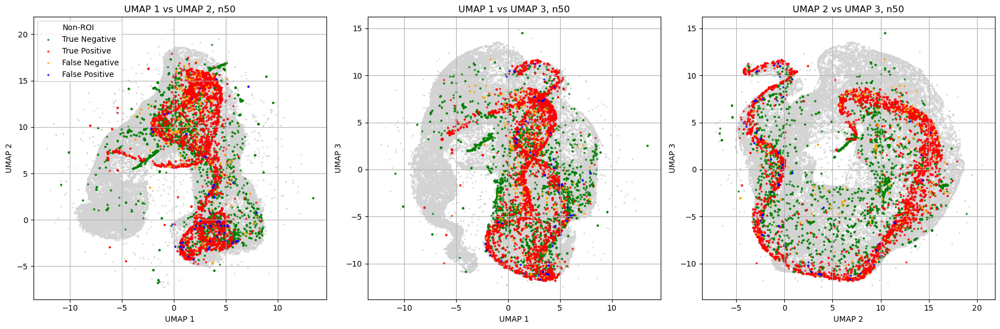

In [13]:
# n50 d3

import numpy as np
import matplotlib.pyplot as plt
import rasterio

# --- Load 3-band UMAP image ---
with rasterio.open("/Volumes/GEOG/Structure_classification/UMAP/umap_800/PostFireAVIRIS_800_again_UMAP_n50_d3") as src:
    umap_data = src.read()  # shape: (3, H, W)

# Load ROI masks
roi_files = ['/Volumes/GEOG/Structure_classification/UMAP/TN_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/TP_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/FN_confident_mask', '/Volumes/GEOG/Structure_classification/UMAP/FP_confident_mask']
roi_masks = []
for roi_path in roi_files:
    with rasterio.open(roi_path) as roi_src:
        roi_mask = roi_src.read(1) > 0
        roi_masks.append(roi_mask)

# Rearrange to shape (H, W, 3)
umap_image = np.transpose(umap_data, (1, 2, 0))  # shape: (H, W, 3)
H, W, _ = umap_image.shape

# --- Flatten UMAP image to 2D points ---
umap_flat = umap_image.reshape(-1, 3)  # shape: (H*W, 3)

# --- Create labels array ---
labels = -1 * np.ones(H * W, dtype=int)  # -1 = not in any ROI
for i, mask in enumerate(roi_masks):
    labels[mask.flatten()] = i

# --- Plot all 3 pairwise combinations ---
combinations = [(0, 1), (0, 2), (1, 2)]
axis_labels = [("UMAP 1", "UMAP 2"), ("UMAP 1", "UMAP 3"), ("UMAP 2", "UMAP 3")]

roi_names = ["True Negative", "True Positive", "False Negative", "False Positive"]
colors = ['green', 'red', 'orange', 'blue']

fig, axs = plt.subplots(1, 3, figsize=(18, 6))

for ax, (ix, iy), (xlabel, ylabel) in zip(axs, combinations, axis_labels):
    # Plot non-ROI pixels
    non_roi_idx = labels == -1
    ax.scatter(umap_flat[non_roi_idx, ix], umap_flat[non_roi_idx, iy],
               s=1, color='lightgray', alpha=0.1, label='Non-ROI')

    # Plot ROI pixels
    for i in range(4):
        roi_idx = labels == i
        ax.scatter(umap_flat[roi_idx, ix], umap_flat[roi_idx, iy],
                   s=3, color=colors[i], label=roi_names[i], alpha=0.7)

    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(f"{xlabel} vs {ylabel}, n50")
    ax.grid(True)

# Only show legend in one subplot
axs[0].legend()
plt.tight_layout()
plt.show()


## UMAP of only pixels within structure polygons

/var/folders/br/pyt6szbd2wb4q6n5wqkffrbc0000gn/T/ipykernel_33894/3194724250.py:57: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


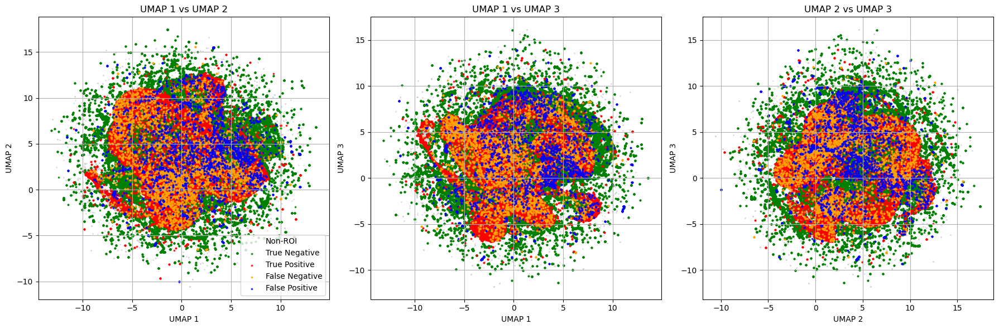

In [6]:
n30 d3

import numpy as np
import matplotlib.pyplot as plt
import rasterio

# --- Load 3-band UMAP image ---
with rasterio.open("/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3") as src:
    umap_data = src.read()  # shape: (3, H, W)

# Load ROI masks
roi_files = ['/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_TN', '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_TP', '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_FN_mask', '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_FP']
roi_masks = []
for roi_path in roi_files:
    with rasterio.open(roi_path) as roi_src:
        roi_mask = roi_src.read(1) > 0
        roi_masks.append(roi_mask)

# Rearrange to shape (H, W, 3)
umap_image = np.transpose(umap_data, (1, 2, 0))  # shape: (H, W, 3)
H, W, _ = umap_image.shape

# --- Flatten UMAP image to 2D points ---
umap_flat = umap_image.reshape(-1, 3)  # shape: (H*W, 3)

# --- Create labels array ---
labels = -1 * np.ones(H * W, dtype=int)  # -1 = not in any ROI
for i, mask in enumerate(roi_masks):
    labels[mask.flatten()] = i

# --- Plot all 3 pairwise combinations ---
combinations = [(0, 1), (0, 2), (1, 2)]
axis_labels = [("UMAP 1", "UMAP 2"), ("UMAP 1", "UMAP 3"), ("UMAP 2", "UMAP 3")]

roi_names = ["True Negative", "True Positive", "False Negative", "False Positive"]
colors = ['green', 'red', 'orange', 'blue']

fig, axs = plt.subplots(1, 3, figsize=(18, 6))

for ax, (ix, iy), (xlabel, ylabel) in zip(axs, combinations, axis_labels):
    # Plot non-ROI pixels
    non_roi_idx = labels == -1
    ax.scatter(umap_flat[non_roi_idx, ix], umap_flat[non_roi_idx, iy],
               s=1, color='lightgray', alpha=0.1, label='Non-ROI')

    # Plot ROI pixels
    for i in range(4):
        roi_idx = labels == i
        ax.scatter(umap_flat[roi_idx, ix], umap_flat[roi_idx, iy],
                   s=3, color=colors[i], label=roi_names[i], alpha=0.7)

    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(f"{xlabel} vs {ylabel}")
    ax.grid(True)

# Only show legend in one subplot
axs[0].legend()
plt.tight_layout()
plt.show()


/var/folders/br/pyt6szbd2wb4q6n5wqkffrbc0000gn/T/ipykernel_33894/1281923588.py:53: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


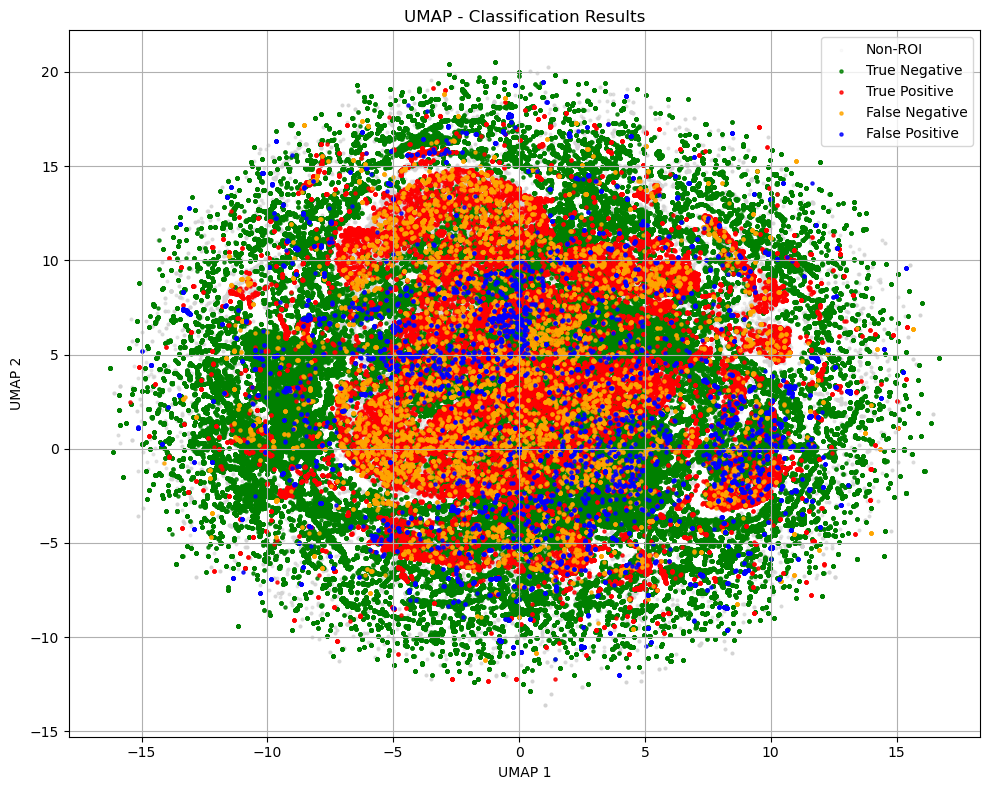

In [7]:
# n30 d2

import numpy as np
import matplotlib.pyplot as plt
import rasterio

# --- Load UMAP image ---
# Load 2-band UMAP image
with rasterio.open("/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d2") as src:
    umap_data = src.read()  # shape: (2, H, W)

# Load ROI masks
roi_files = ['/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_TN', '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_TP', '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_FN_mask', '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_FP']
roi_masks = []
for roi_path in roi_files:
    with rasterio.open(roi_path) as roi_src:
        roi_mask = roi_src.read(1) > 0  # or == 1, depending on your ROI format
        roi_masks.append(roi_mask)

# Rearrange to shape (H, W, 2)
umap_image = np.transpose(umap_data, (1, 2, 0))  # shape: (H, W, 2)
H, W, _ = umap_image.shape

# --- Flatten UMAP image to 2D points ---
umap_flat = umap_image.reshape(-1, 2)  # shape: (H*W, 2)

# --- Create labels array ---
labels = -1 * np.ones(H * W, dtype=int)  # -1 = not in any ROI
for i, mask in enumerate(roi_masks):
    labels[mask.flatten()] = i

# --- Plot ---
plt.figure(figsize=(10, 8))

# Plot non-ROI pixels in light gray
non_roi_idx = labels == -1
plt.scatter(umap_flat[non_roi_idx, 0], umap_flat[non_roi_idx, 1],
            s=3, color='lightgray', alpha=0.1, label='Non-ROI')

# Custom ROI names
roi_names = ["True Negative", "True Positive", "False Negative", "False Positive"]

# Plot ROI pixels with custom labels
colors = ['green', 'red', 'orange', 'blue']
for i in range(4):
    roi_idx = labels == i
    plt.scatter(umap_flat[roi_idx, 0], umap_flat[roi_idx, 1],
                s=5, color=colors[i], label=roi_names[i], alpha=0.8)

plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.title("UMAP - Classification Results")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

/var/folders/br/pyt6szbd2wb4q6n5wqkffrbc0000gn/T/ipykernel_70374/1287010170.py:52: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


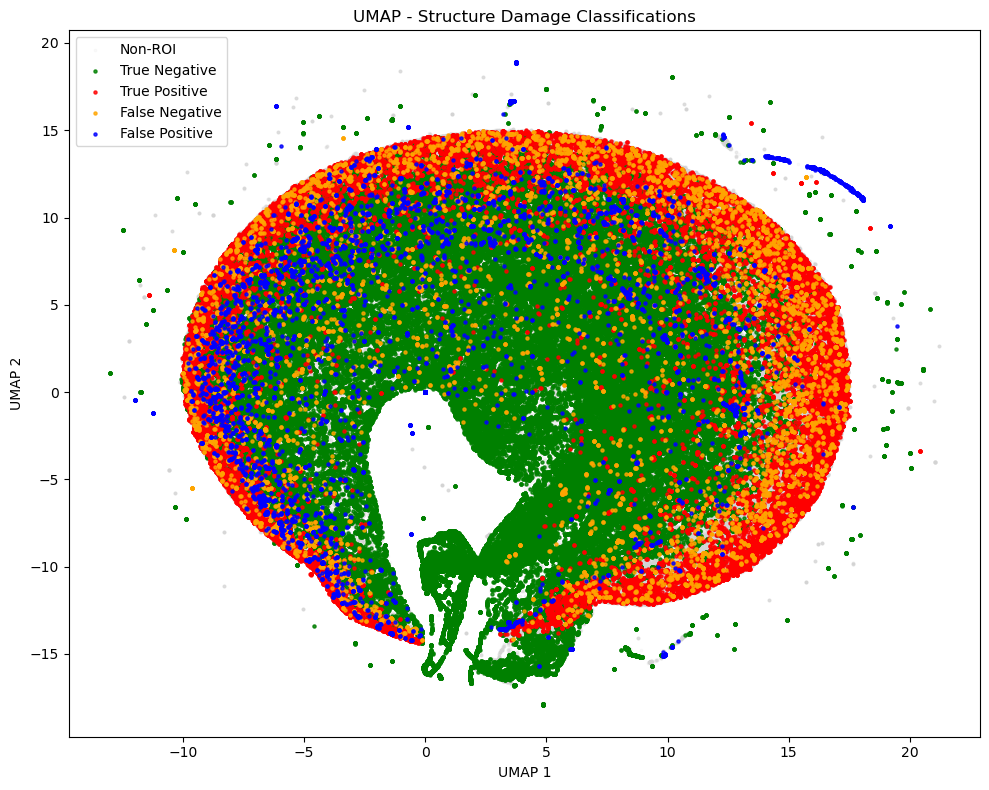

In [13]:
# n100 d2

import numpy as np
import matplotlib.pyplot as plt
import rasterio

# --- Load UMAP image ---
# Load 2-band UMAP image
with rasterio.open("/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0__UMAP_structures_n100_d2") as src:
    umap_data = src.read()  # shape: (2, H, W)

# Load ROI masks
roi_files = ['/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_TN', '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_TP', '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_FN_mask', '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_FP']
roi_masks = []
for roi_path in roi_files:
    with rasterio.open(roi_path) as roi_src:
        roi_mask = roi_src.read(1) > 0  # or == 1, depending on your ROI format
        roi_masks.append(roi_mask)

# Rearrange to shape (H, W, 2)
umap_image = np.transpose(umap_data, (1, 2, 0))  # shape: (H, W, 2)
H, W, _ = umap_image.shape

# --- Flatten UMAP image to 2D points ---
umap_flat = umap_image.reshape(-1, 2)  # shape: (H*W, 2)

# --- Create labels array ---
labels = -1 * np.ones(H * W, dtype=int)  # -1 = not in any ROI
for i, mask in enumerate(roi_masks):
    labels[mask.flatten()] = i

# --- Plot ---
plt.figure(figsize=(10, 8))

# Plot non-ROI pixels in light gray
non_roi_idx = labels == -1
plt.scatter(umap_flat[non_roi_idx, 0], umap_flat[non_roi_idx, 1],
            s=3, color='lightgray', alpha=0.1, label='Non-ROI')

# Custom ROI names
roi_names = ["True Negative", "True Positive", "False Negative", "False Positive"]

# Plot ROI pixels with custom labels
colors = ['green', 'red', 'orange', 'blue']
for i in range(4):
    roi_idx = labels == i
    plt.scatter(umap_flat[roi_idx, 0], umap_flat[roi_idx, 1],
                s=5, color=colors[i], label=roi_names[i], alpha=0.8)

plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.title("UMAP - Structure Damage Classifications")
plt.legend()
plt.tight_layout()
plt.show()

/var/folders/br/pyt6szbd2wb4q6n5wqkffrbc0000gn/T/ipykernel_70374/1312275050.py:57: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


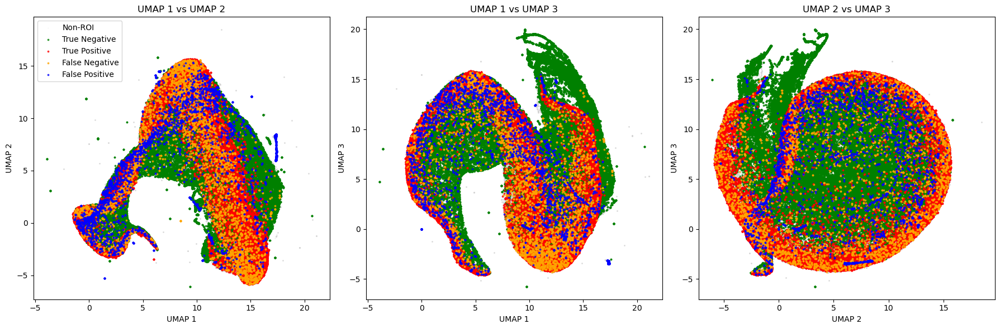

In [14]:
# n100 d3

import numpy as np
import matplotlib.pyplot as plt
import rasterio

# --- Load 3-band UMAP image ---
with rasterio.open("/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0__UMAP_structures_n100_d3") as src:
    umap_data = src.read()  # shape: (3, H, W)

# Load ROI masks
roi_files = ['/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_TN', '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_TP', '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_FN_mask', '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_FP']
roi_masks = []
for roi_path in roi_files:
    with rasterio.open(roi_path) as roi_src:
        roi_mask = roi_src.read(1) > 0
        roi_masks.append(roi_mask)

# Rearrange to shape (H, W, 3)
umap_image = np.transpose(umap_data, (1, 2, 0))  # shape: (H, W, 3)
H, W, _ = umap_image.shape

# --- Flatten UMAP image to 2D points ---
umap_flat = umap_image.reshape(-1, 3)  # shape: (H*W, 3)

# --- Create labels array ---
labels = -1 * np.ones(H * W, dtype=int)  # -1 = not in any ROI
for i, mask in enumerate(roi_masks):
    labels[mask.flatten()] = i

# --- Plot all 3 pairwise combinations ---
combinations = [(0, 1), (0, 2), (1, 2)]
axis_labels = [("UMAP 1", "UMAP 2"), ("UMAP 1", "UMAP 3"), ("UMAP 2", "UMAP 3")]

roi_names = ["True Negative", "True Positive", "False Negative", "False Positive"]
colors = ['green', 'red', 'orange', 'blue']

fig, axs = plt.subplots(1, 3, figsize=(18, 6))

for ax, (ix, iy), (xlabel, ylabel) in zip(axs, combinations, axis_labels):
    # Plot non-ROI pixels
    non_roi_idx = labels == -1
    ax.scatter(umap_flat[non_roi_idx, ix], umap_flat[non_roi_idx, iy],
               s=1, color='lightgray', alpha=0.1, label='Non-ROI')

    # Plot ROI pixels
    for i in range(4):
        roi_idx = labels == i
        ax.scatter(umap_flat[roi_idx, ix], umap_flat[roi_idx, iy],
                   s=3, color=colors[i], label=roi_names[i], alpha=0.7)

    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(f"{xlabel} vs {ylabel}")


# Only show legend in one subplot
axs[0].legend()
plt.tight_layout()
plt.show()


# PCA

/var/folders/br/pyt6szbd2wb4q6n5wqkffrbc0000gn/T/ipykernel_70374/1972753854.py:90: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


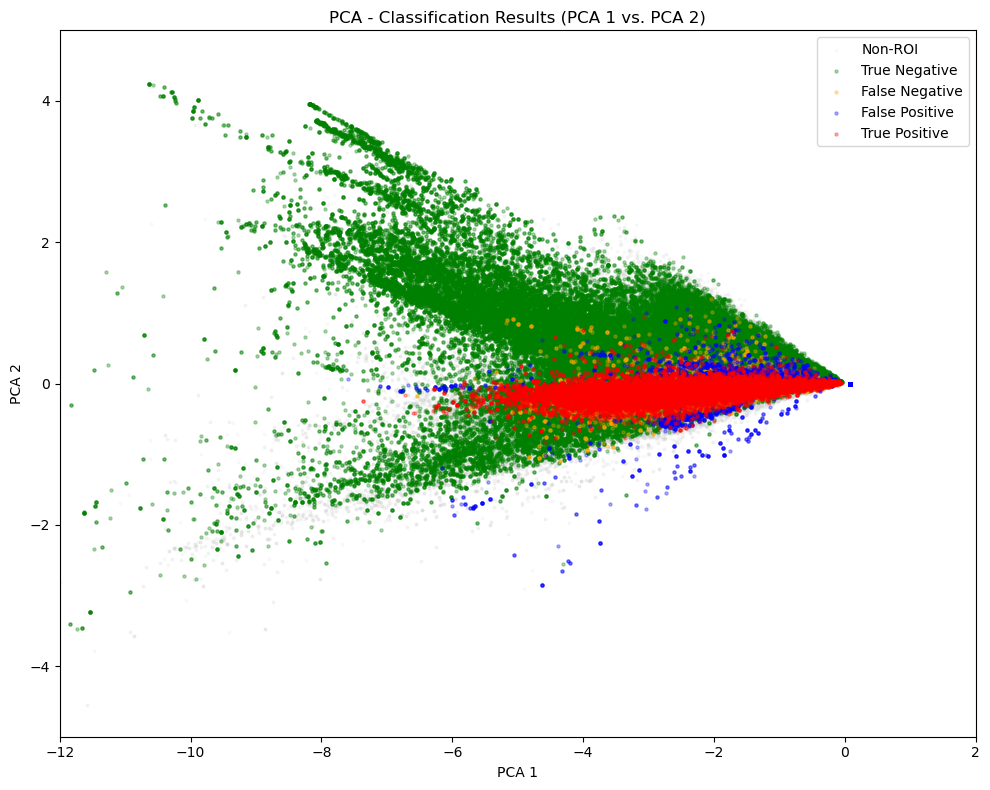

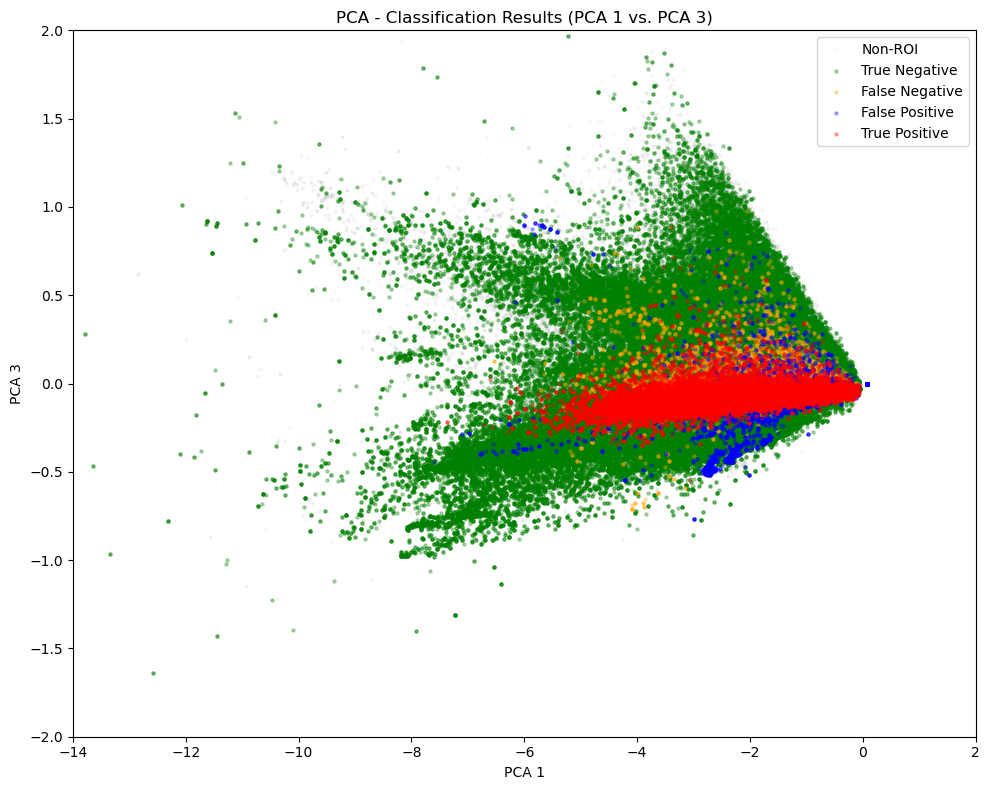

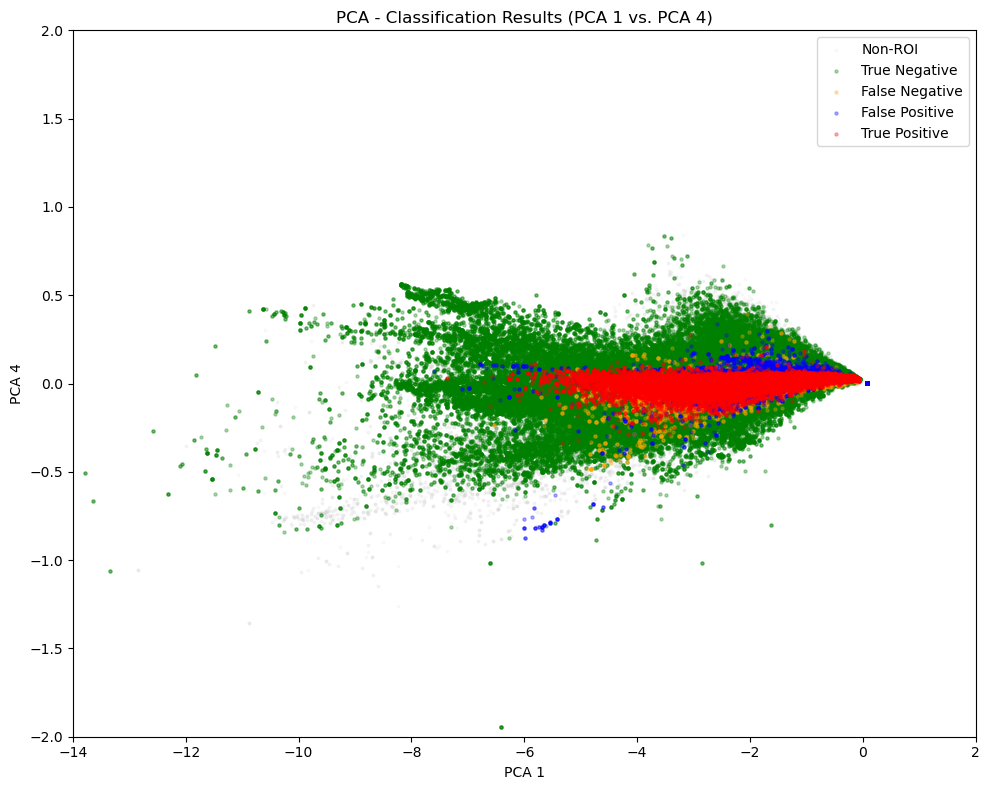

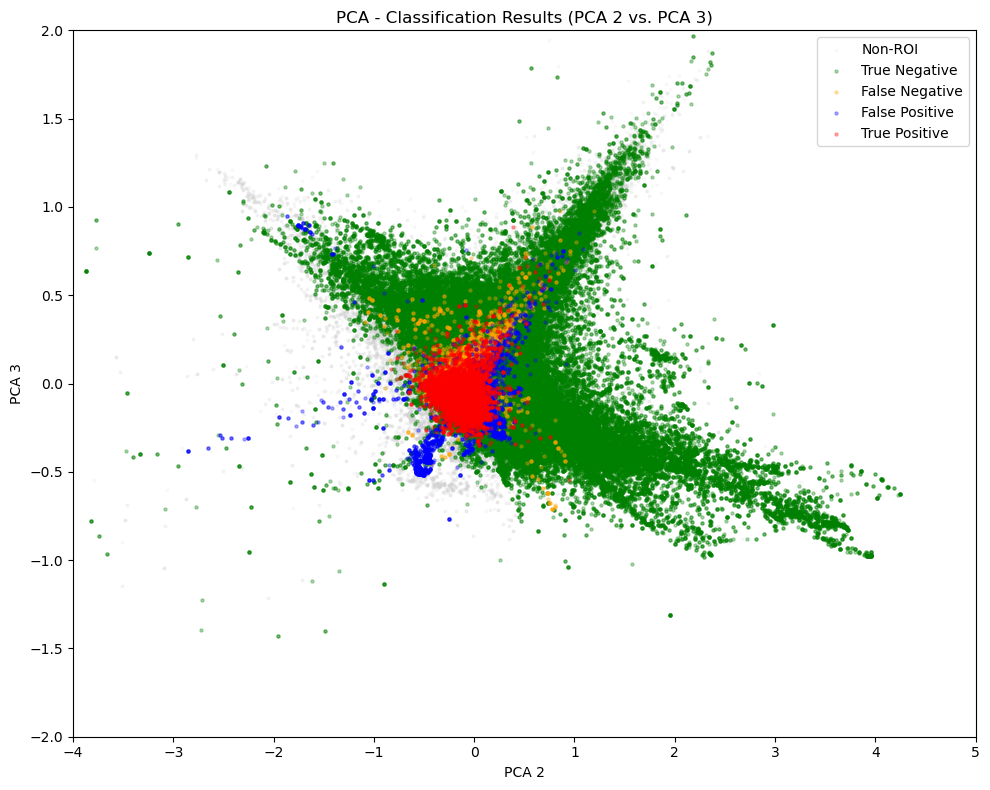

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio

# --- Load PCA bands 1–4 ---
with rasterio.open("/Volumes/GEOG/Structure_classification/PCA/AV3_structures_PCA") as src:
    pca1 = src.read(1).astype(float)
    pca2 = src.read(2).astype(float)
    pca3 = src.read(3).astype(float)
    pca4 = src.read(4).astype(float)
    nodata_val = src.nodata

# --- Handle NoData ---
if nodata_val is not None:
    for band in [pca1, pca2, pca3, pca4]:
        band[band == nodata_val] = np.nan

# --- Load ROI masks ---
roi_files = [
    '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_TN',
    '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_TP',
    '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_FN_mask',
    '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_FP'
]

roi_masks = []
for roi_path in roi_files:
    with rasterio.open(roi_path) as roi_src:
        roi_masks.append(roi_src.read(1) > 0)

# --- Flatten and stack all PCA bands ---
p1, p2, p3, p4 = pca1.flatten(), pca2.flatten(), pca3.flatten(), pca4.flatten()
points = np.column_stack((p1, p2, p3, p4))  # shape: (N, 4)

# --- Label ROI pixels ---
labels = -1 * np.ones(p1.shape[0], dtype=int)
for i, mask in enumerate(roi_masks):
    labels[mask.flatten()] = i

# --- Set up plotting ---
plot_configs = [
    {
        "x": 0, "y": 1,
        "xlabel": "PCA 1", "ylabel": "PCA 2",
        "xlim": (-12, 2), "ylim": (-5, 5)
    },
    {
        "x": 0, "y": 2,
        "xlabel": "PCA 1", "ylabel": "PCA 3",
        "xlim": (-14, 2), "ylim": (-2, 2)
    },
    {
        "x": 0, "y": 3,
        "xlabel": "PCA 1", "ylabel": "PCA 4",
        "xlim": (-14, 2), "ylim": (-2, 2)
    },
    {
        "x": 1, "y": 2,
        "xlabel": "PCA 2", "ylabel": "PCA 3",
        "xlim": (-4, 5), "ylim": (-2, 2)
    }
]

roi_names = ["True Negative", "True Positive", "False Negative", "False Positive"]
colors = ['green', 'red', 'orange', 'blue']

for cfg in plot_configs:
    plt.figure(figsize=(10, 8))

    # Plot background points
    non_roi = labels == -1
    plt.scatter(points[non_roi, cfg["x"]], points[non_roi, cfg["y"]],
                s=3, color='lightgray', alpha=0.1, label="Non-ROI")
    
    roi_order = [0, 2, 3, 1]  # TN, FN, FP, TP

    # Plot each ROI
    for i in roi_order:
        idx = labels == i
        plt.scatter(points[idx, cfg["x"]], points[idx, cfg["y"]],
                s=5, color=colors[i], label=roi_names[i], alpha=0.3)


    plt.xlabel(cfg["xlabel"])
    plt.ylabel(cfg["ylabel"])
    plt.title(f"PCA - Classification Results ({cfg['xlabel']} vs. {cfg['ylabel']})")
    plt.legend()
    plt.xlim(cfg["xlim"])
    plt.ylim(cfg["ylim"])
    plt.tight_layout()
    plt.show()

/var/folders/br/pyt6szbd2wb4q6n5wqkffrbc0000gn/T/ipykernel_70374/582492890.py:90: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


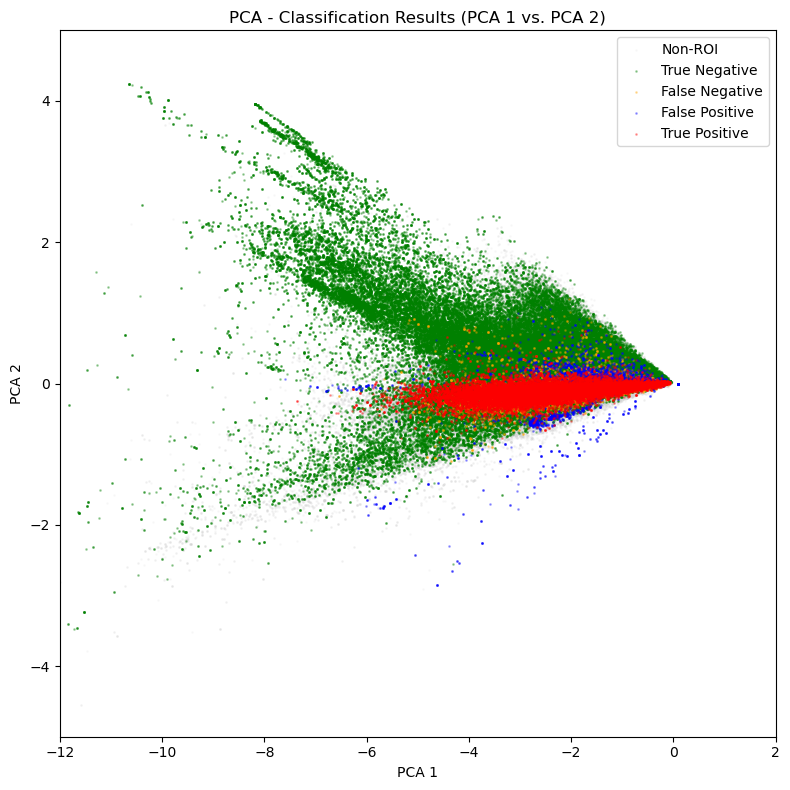

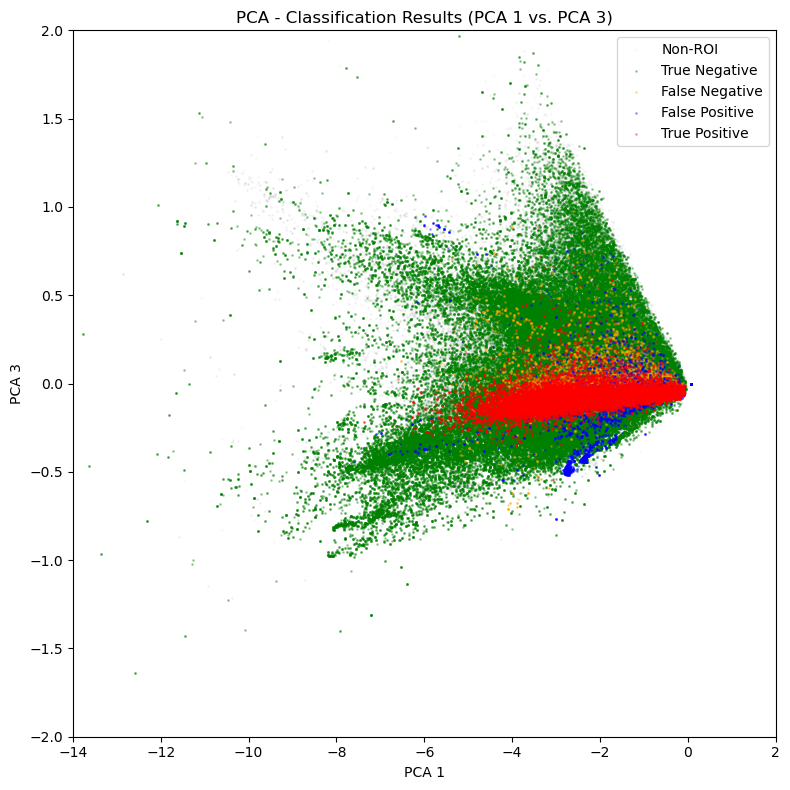

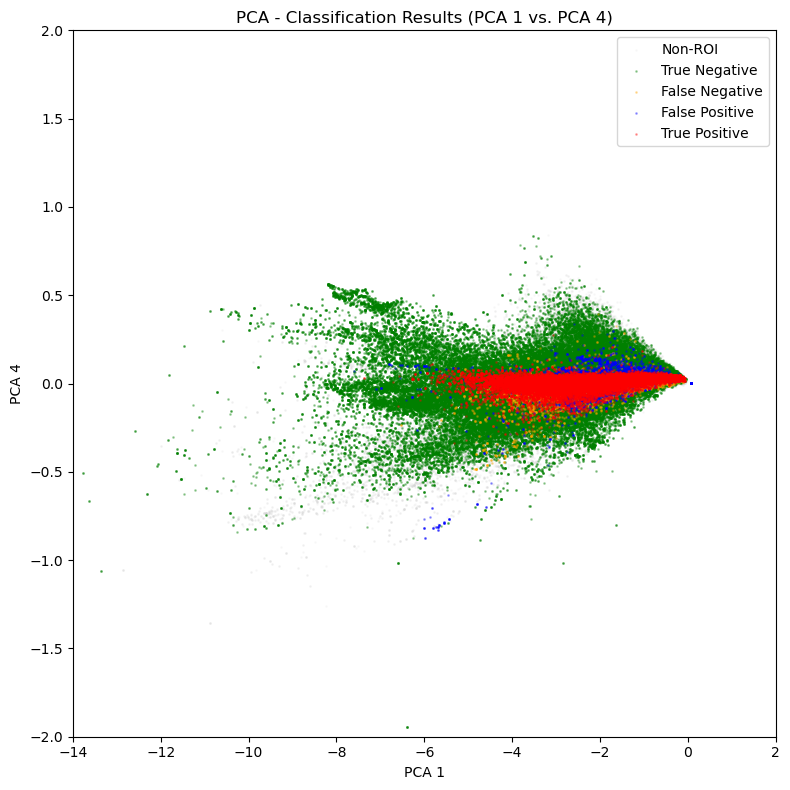

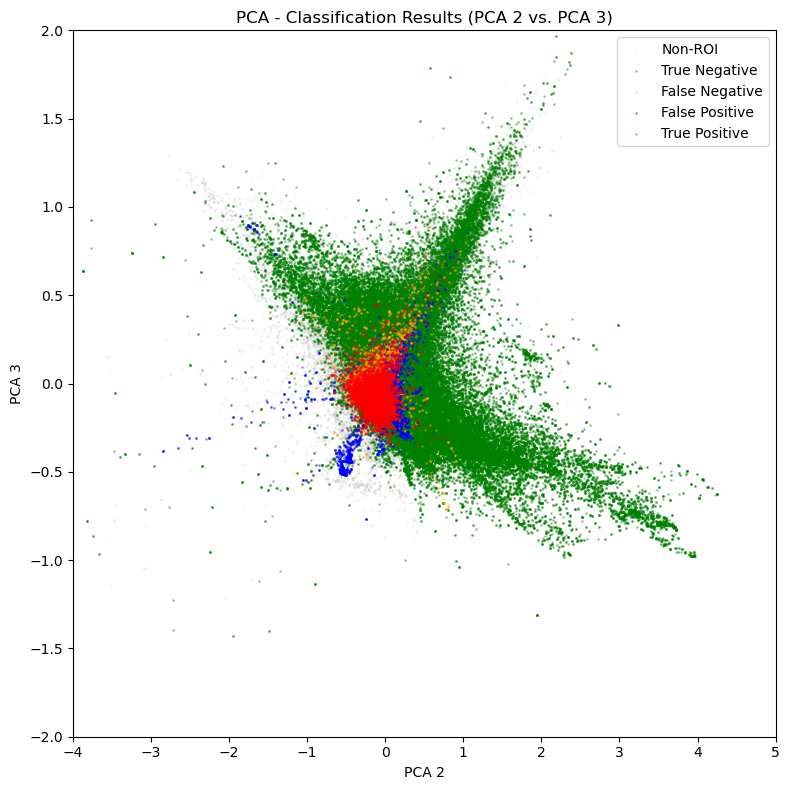

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio

# --- Load PCA bands 1–4 ---
with rasterio.open("/Volumes/GEOG/Structure_classification/PCA/AV3_structures_PCA") as src:
    pca1 = src.read(1).astype(float)
    pca2 = src.read(2).astype(float)
    pca3 = src.read(3).astype(float)
    pca4 = src.read(4).astype(float)
    nodata_val = src.nodata

# --- Handle NoData ---
if nodata_val is not None:
    for band in [pca1, pca2, pca3, pca4]:
        band[band == nodata_val] = np.nan

# --- Load ROI masks ---
roi_files = [
    '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_TN',
    '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_TP',
    '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_FN_mask',
    '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_FP'
]

roi_masks = []
for roi_path in roi_files:
    with rasterio.open(roi_path) as roi_src:
        roi_masks.append(roi_src.read(1) > 0)

# --- Flatten and stack all PCA bands ---
p1, p2, p3, p4 = pca1.flatten(), pca2.flatten(), pca3.flatten(), pca4.flatten()
points = np.column_stack((p1, p2, p3, p4))  # shape: (N, 4)

# --- Label ROI pixels ---
labels = -1 * np.ones(p1.shape[0], dtype=int)
for i, mask in enumerate(roi_masks):
    labels[mask.flatten()] = i

# --- Set up plotting ---
plot_configs = [
    {
        "x": 0, "y": 1,
        "xlabel": "PCA 1", "ylabel": "PCA 2",
        "xlim": (-12, 2), "ylim": (-5, 5)
    },
    {
        "x": 0, "y": 2,
        "xlabel": "PCA 1", "ylabel": "PCA 3",
        "xlim": (-14, 2), "ylim": (-2, 2)
    },
    {
        "x": 0, "y": 3,
        "xlabel": "PCA 1", "ylabel": "PCA 4",
        "xlim": (-14, 2), "ylim": (-2, 2)
    },
    {
        "x": 1, "y": 2,
        "xlabel": "PCA 2", "ylabel": "PCA 3",
        "xlim": (-4, 5), "ylim": (-2, 2)
    }
]

roi_names = ["True Negative", "True Positive", "False Negative", "False Positive"]
colors = ['green', 'red', 'orange', 'blue']

for cfg in plot_configs:
    plt.figure(figsize=(8, 8))

    # Plot background points
    non_roi = labels == -1
    plt.scatter(points[non_roi, cfg["x"]], points[non_roi, cfg["y"]],
                s=1, color='lightgray', alpha=0.1, label="Non-ROI")
    
    roi_order = [0, 2, 3, 1]  # TN, FN, FP, TP

    # Plot each ROI
    for i in roi_order:
        idx = labels == i
        plt.scatter(points[idx, cfg["x"]], points[idx, cfg["y"]],
                s=1, color=colors[i], label=roi_names[i], alpha=0.3)


    plt.xlabel(cfg["xlabel"])
    plt.ylabel(cfg["ylabel"])
    plt.title(f"PCA - Classification Results ({cfg['xlabel']} vs. {cfg['ylabel']})")
    plt.legend()
    plt.xlim(cfg["xlim"])
    plt.ylim(cfg["ylim"])
    plt.tight_layout()
    plt.show()



/var/folders/br/pyt6szbd2wb4q6n5wqkffrbc0000gn/T/ipykernel_70374/3488893082.py:83: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


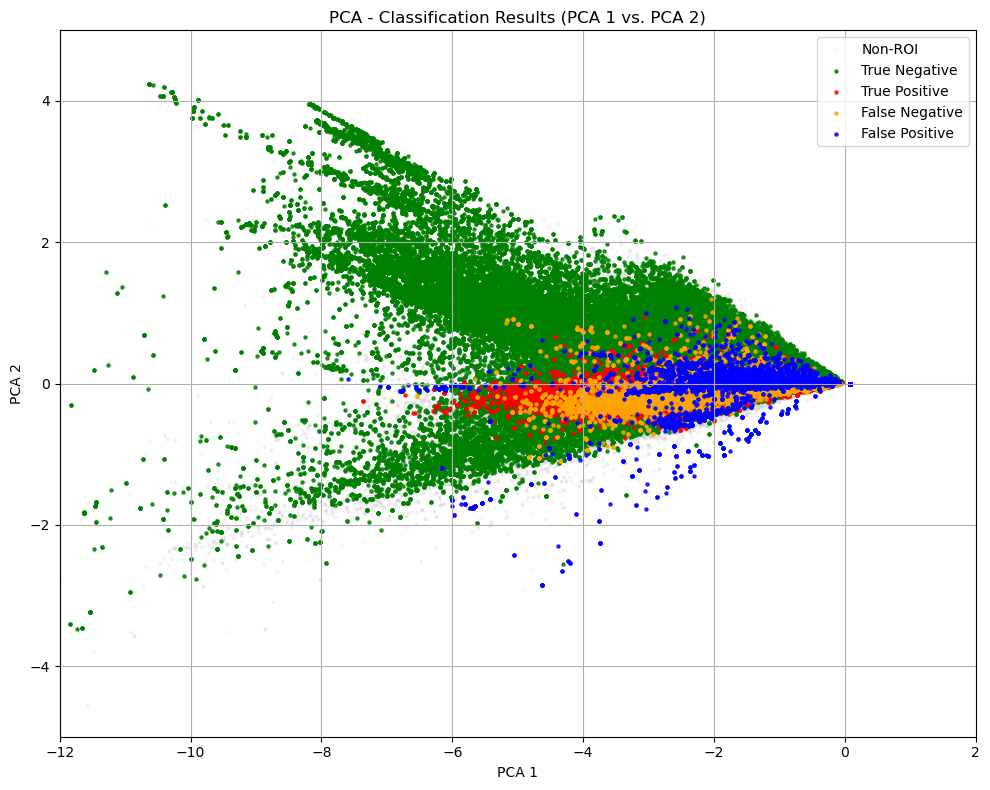

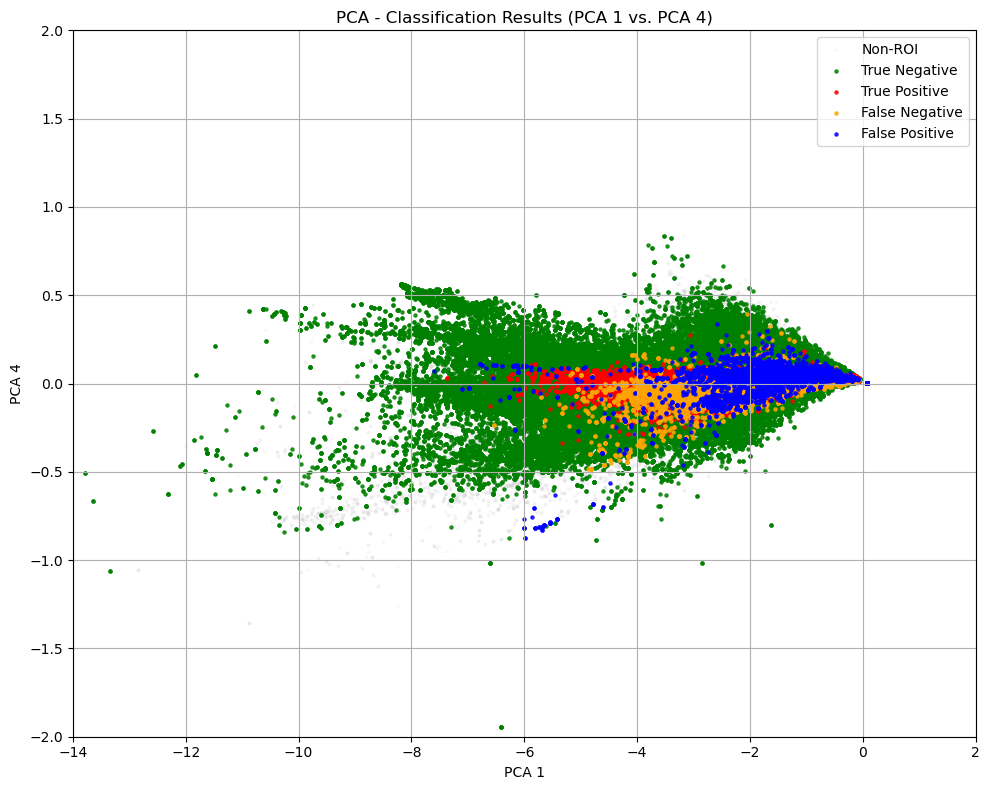

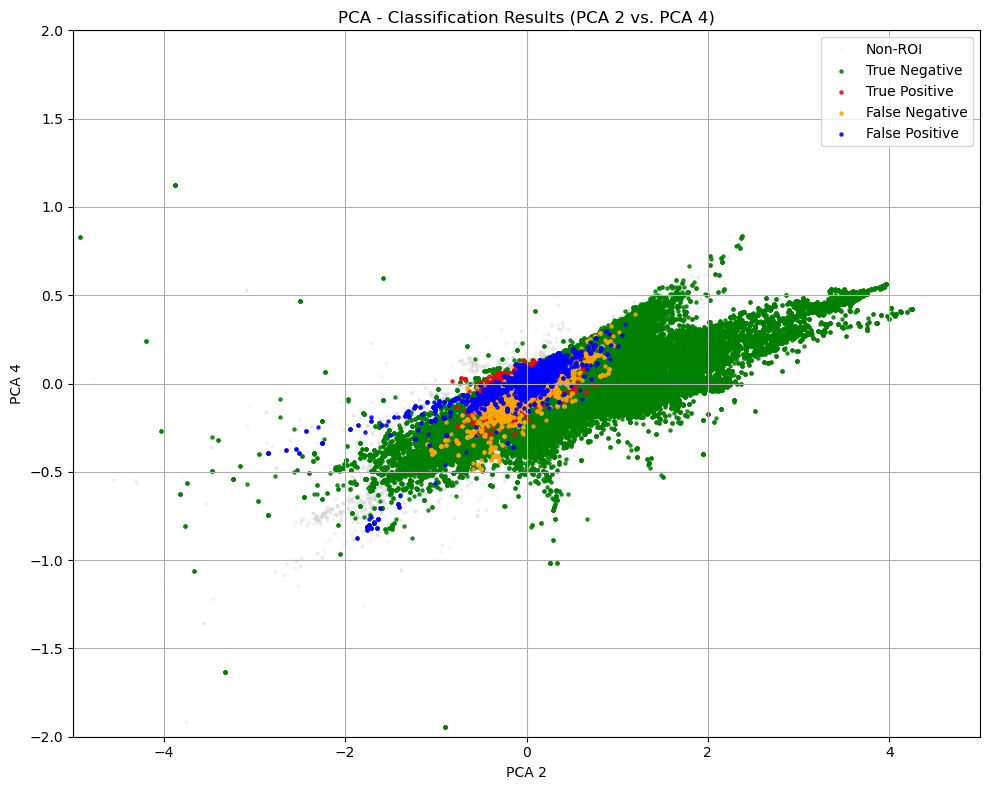

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import rasterio

# --- Load PCA bands 1–4 ---
with rasterio.open("/Volumes/GEOG/Structure_classification/PCA/AV3_structures_PCA") as src:
    pca1 = src.read(1).astype(float)
    pca2 = src.read(2).astype(float)
    pca3 = src.read(3).astype(float)
    pca4 = src.read(4).astype(float)
    nodata_val = src.nodata

# --- Handle NoData ---
if nodata_val is not None:
    for band in [pca1, pca2, pca3, pca4]:
        band[band == nodata_val] = np.nan

# --- Load ROI masks ---
roi_files = [
    '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_TN',
    '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_TP',
    '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_FN_mask',
    '/Volumes/GEOG/Structure_classification/UMAP/AV3_Eaton_mosaic_ROI_masked_structures_0_again_UMAP_n30_d3_FP'
]

roi_masks = []
for roi_path in roi_files:
    with rasterio.open(roi_path) as roi_src:
        roi_masks.append(roi_src.read(1) > 0)

# --- Flatten and stack all PCA bands ---
p1, p2, p3, p4 = pca1.flatten(), pca2.flatten(), pca3.flatten(), pca4.flatten()
points = np.column_stack((p1, p2, p3, p4))  # shape: (N, 4)

# --- Label ROI pixels ---
labels = -1 * np.ones(p1.shape[0], dtype=int)
for i, mask in enumerate(roi_masks):
    labels[mask.flatten()] = i

# --- Set up plotting ---
plot_configs = [
    {
        "x": 0, "y": 1,
        "xlabel": "PCA 1", "ylabel": "PCA 2",
        "xlim": (-12, 2), "ylim": (-5, 5)
    },
    {
        "x": 0, "y": 3,
        "xlabel": "PCA 1", "ylabel": "PCA 4",
        "xlim": (-14, 2), "ylim": (-2, 2)
    },
    {
        "x": 1, "y": 3,
        "xlabel": "PCA 2", "ylabel": "PCA 4",
        "xlim": (-5, 5), "ylim": (-2, 2)
    }
]

roi_names = ["True Negative", "True Positive", "False Negative", "False Positive"]
colors = ['green', 'red', 'orange', 'blue']

for cfg in plot_configs:
    plt.figure(figsize=(10, 8))

    # Plot background points
    non_roi = labels == -1
    plt.scatter(points[non_roi, cfg["x"]], points[non_roi, cfg["y"]],
                s=3, color='lightgray', alpha=0.1, label="Non-ROI")

    # Plot each ROI
    for i in range(4):
        idx = labels == i
        plt.scatter(points[idx, cfg["x"]], points[idx, cfg["y"]],
                    s=5, color=colors[i], label=roi_names[i], alpha=0.8)

    plt.xlabel(cfg["xlabel"])
    plt.ylabel(cfg["ylabel"])
    plt.title(f"PCA - Classification Results ({cfg['xlabel']} vs. {cfg['ylabel']})")
    plt.legend()
    plt.grid(True)
    plt.xlim(cfg["xlim"])
    plt.ylim(cfg["ylim"])
    plt.tight_layout()
    plt.show()